In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import plotly.express as px
from pandas_profiling import ProfileReport
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.eval_measures import rmse
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV, Lasso
import sklearn.metrics as metrics
from sklearn.feature_selection import chi2
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor, plot_importance

In [2]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [3]:
def regression_results(y_true, y_pred):
    print(color.UNDERLINE+'EVALUATION METRICS'+color.END)
    # Regression metrics
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)
 
    print(color.BOLD + 'R2:  ' + color.END, round(r2,5))
    print(color.BOLD + 'MAE: ' + color.END, round(mean_absolute_error,5))
    print(color.BOLD + 'MSE: ' + color.END, round(mse,5))
    print(color.BOLD + 'RMSE:' + color.END, round(np.sqrt(mse),5))

In [4]:
def coef_results(x_train,model,pvalues=None):
    print(color.UNDERLINE+'COEFFICIENTS'+color.END)
    print(color.BOLD +"Intercept:" + color.END,
          round(model.intercept_,4))
    for i in range(model.n_features_in_):
        print(color.BOLD + str(x_train.columns[i])+':'+ color.END,
              round(model.coef_[i],6))
        if pvalues != None:
            print('P-Value:',str(round(pvalues[i+1],6)))

In [5]:
def regression(method, x_dat, y_dat, regression_type,
               return_y_pred = True, return_model = True, **params):
    
    #fit model
    mod = method(**params)
    mod.fit(x_dat, y_dat)
    y_pred = mod.predict(x_dat)
    
    regression_results(y_dat, y_pred)
    
    x_dat_stats = sm.add_constant(x_dat)
    mod_stats = sm.OLS(y_dat,x_dat_stats)
    fit_stats = mod_stats.fit()
    
    if method == LinearRegression:
        pvalues = list(fit_stats.summary2().tables[1]['P>|t|'])
    else:
        pvalues = None
    
    if regression_type == 'Tree':
        print('Feature Importance Plot')
        sns.barplot(y=x_dat.columns, x=mod.feature_importances_)
        plt.xlabel('Mean Decrease Gini')
        plt.show()
    
    if regression_type == 'Linear':
        coef_results(x_dat, mod, pvalues)
    
    # Predicted vs Actual
    plt.figure(figsize=(6,6))
    sns.scatterplot(x=y_dat, y=y_pred)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Predicted Vs. Actual Values')
    plt.show()
    
    # QQ Plot
    plt.figure(figsize=(6,6))
    resid_1 = y_pred-y_dat
    fig = sm.qqplot(resid_1, line='s')
    plt.title('QQ-Plot')
    plt.show()
    
    # Residual Plot
    plt.figure(figsize=(6,6))
    sns.regplot(x=y_dat,y=resid_1)
    plt.title('Residual Plot')
    plt.ylabel('Residuals')
    plt.xlabel('Predicted Y')
    plt.show()
    
    # Residual Histogram
    plt.figure(figsize=(6,6))
    sns.histplot(resid_1)
    plt.title('Histogram of Residuals')
    plt.ylabel('Count')
    plt.xlabel('Residual Value')
    
    if (return_y_pred and return_model) == True:
        return y_pred, mod
    elif return_model == True:
        return mod
    elif return_y_pred == True:
        return y_pred


In [47]:
# Load in Datasets

life_df_1 = pd.read_csv("lifeexpectancy1.csv", skipinitialspace = True)
life_df_2 = pd.read_csv("lifeexpectancy2.csv", skipinitialspace = True)

print(life_df_1.shape)
print(life_df_2.shape)

(63, 20)
(138, 13)


In [49]:
life_df_1.describe()

,literacyrate,homicidiesper100k,electricity,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,fertilityrate,lifeexp,internet,gdppercapita,CO2,forest,urbanpop,urbanpopgrowth,leastdeveloped
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,90.855738,8.480075,3180.130238,13.812698,0.301587,93.607937,99.966032,3.565625,941.625614,2.093651,74.546479,50.095455,11401.410232,5.098952,28.824254,62.838254,1.793002,0.063492
std,11.415314,13.505596,3079.924620,1.975943,0.765905,8.435893,153.260745,3.677218,741.099000,0.730110,4.749936,21.313965,10922.014640,5.931027,18.061317,18.587705,1.804854,0.245805
min,55.375190,0.256959,139.143681,7.800000,0.100000,63.100000,0.760000,-1.418184,62.371029,1.230000,60.775000,11.520000,706.238698,0.173226,0.006462,18.182000,-1.342915,0.000000
25%,89.575586,1.406002,1172.546581,12.750000,0.100000,91.300000,16.000000,0.821417,402.365396,1.550000,72.891000,37.545000,3906.982942,1.633844,13.207710,53.728500,0.451288,0.000000
50%,94.477049,3.174406,2539.611194,13.700000,0.100000,96.300000,42.000000,2.981309,718.455376,1.970000,74.895000,52.570000,7864.760672,3.562928,30.744962,63.261000,1.610582,0.000000
75%,98.641356,8.040484,3968.878997,15.150000,0.100000,99.600000,92.500000,6.082609,1304.793333,2.495500,77.112073,66.300000,15255.342448,6.388889,41.364352,76.933000,2.819793,0.000000
max,99.895903,66.873147,19592.231949,17.600000,4.300000,100.000000,820.000000,18.119554,3030.625396,5.104000,83.229268,90.503133,56957.078574,33.840519,65.647374,100.000000,8.389374,1.000000


In [50]:
life_df_2.describe()

,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,fertilityrate,lifeexp,CO2,urbanpopgrowth,leastdeveloped
count,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000,138.000000
mean,13.044203,0.643478,88.554348,121.607681,3.816283,1111.596390,2.832897,71.615724,4.817753,2.387124,0.253623
std,2.939835,1.311708,14.732248,162.039059,5.065714,1347.764785,1.395983,8.202395,6.832746,1.980082,0.436669
min,5.300000,0.100000,40.000000,0.760000,-1.509245,34.289633,1.230000,50.621000,0.027033,-1.342915,0.000000
25%,10.825000,0.100000,81.725000,14.000000,0.860427,158.076743,1.742500,66.151250,0.587155,0.932280,0.000000
50%,13.100000,0.100000,95.350000,53.000000,2.704123,545.677923,2.302000,73.752500,2.396420,2.211662,0.000000
75%,15.200000,0.400000,99.675000,166.500000,5.208063,1372.105575,3.752000,77.151037,6.396539,3.687510,0.750000
max,20.400000,9.400000,100.000000,852.000000,36.906643,5812.713900,7.338000,83.587805,47.488879,11.588452,1.000000


In [7]:
profile1 = ProfileReport(life_df_1)
profile1

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile2 = ProfileReport(life_df_2)
profile2

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

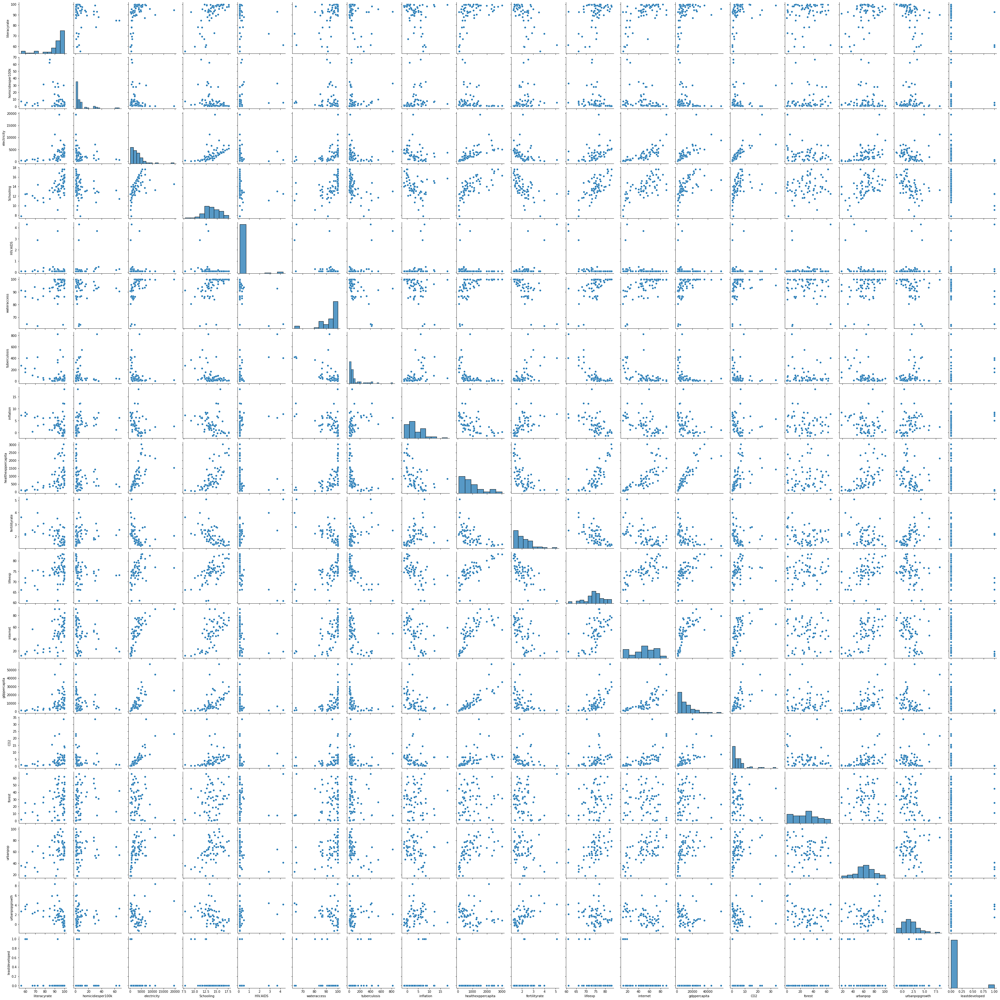

In [53]:
sns.pairplot(life_df_1)

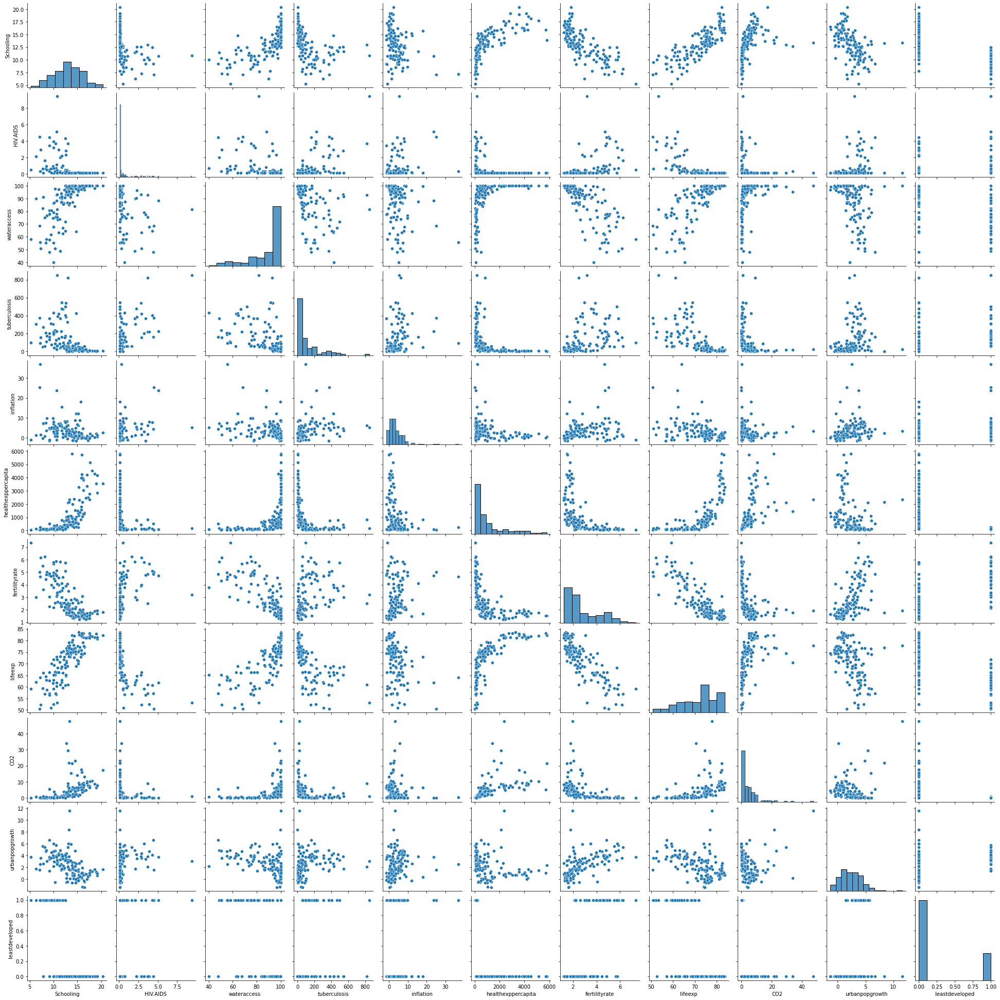

In [54]:
sns.pairplot(life_df_2)

In [9]:
life_df_1.head(3)

,Country,literacyrate,homicidiesper100k,electricity,Schooling,HIV.AIDS,Status,wateraccess,tuberculosis,inflation,healthexppercapita,fertilityrate,lifeexp,internet,gdppercapita,CO2,forest,urbanpop,urbanpopgrowth,leastdeveloped
0,Albania,96.845299,4.005786,2309.366503,14.2,0.1,Developing,95.1,16.0,1.613042,517.071413,1.710,77.963,60.100000,4578.667934,1.582049,28.191972,56.423,1.652458,0
1,Algeria,72.648679,1.475201,1356.264554,14.4,0.1,Developing,84.0,72.0,2.916927,624.662826,2.890,75.641,29.500000,5466.425778,3.326497,0.818057,70.221,2.826317,0
2,Armenia,99.744413,2.477445,1965.783733,12.7,0.1,Developing,100.0,57.0,2.981309,426.113567,1.634,74.255,54.622806,3994.712355,1.704295,11.654373,63.112,-0.465285,0


In [10]:
life_df_1.columns

Index(['Country', 'literacyrate', 'homicidiesper100k', 'electricity',
       'Schooling', 'HIV.AIDS', 'Status', 'wateraccess', 'tuberculosis',
       'inflation', 'healthexppercapita', 'fertilityrate', 'lifeexp',
       'internet', 'gdppercapita', 'CO2', 'forest', 'urbanpop',
       'urbanpopgrowth', 'leastdeveloped'],
      dtype='object')

In [11]:
life_df_2.columns

Index(['Country', 'Schooling', 'HIV.AIDS', 'Status', 'wateraccess',
       'tuberculosis', 'inflation', 'healthexppercapita', 'fertilityrate',
       'lifeexp', 'CO2', 'urbanpopgrowth', 'leastdeveloped'],
      dtype='object')

In [51]:
# Standardize the First Dataset

y_life_1 = life_df_1['lifeexp']
y_fert_1 = life_df_1['fertilityrate']
x_1 = life_df_1.drop(['Country','lifeexp','fertilityrate','Status',
                      'leastdeveloped'],axis = 1)

x_1 = pd.DataFrame(data=StandardScaler().fit_transform(x_1),
                  columns = x_1.columns)
x_1.head(3)

,literacyrate,homicidiesper100k,electricity,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,internet,gdppercapita,CO2,forest,urbanpop,urbanpopgrowth
0,0.528910,-0.333952,-0.284993,0.197583,-0.265316,0.178292,-0.552264,-0.535260,-0.577473,0.473159,-0.629696,-0.597730,-0.035289,-0.347906,-0.078496
1,-1.607779,-0.522831,-0.596935,0.299613,-0.265316,-1.148084,-0.183939,-0.177827,-0.431128,-0.974051,-0.547761,-0.301245,-1.563073,0.400375,0.577119
2,0.784917,-0.448025,-0.397445,-0.567646,-0.265316,0.763808,-0.282598,-0.160178,-0.701192,0.214119,-0.683591,-0.576953,-0.958280,0.014846,-1.261280


In [13]:
# Checking for Multicollinearity

x_1.cov()

,literacyrate,homicidiesper100k,electricity,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,internet,gdppercapita,CO2,forest,urbanpop,urbanpopgrowth
literacyrate,1.016129,-0.108864,0.395795,0.651160,-0.326804,0.516470,-0.305102,-0.282127,0.478740,0.640200,0.396857,0.331144,0.213057,0.477730,-0.464583
homicidiesper100k,-0.108864,1.016129,-0.235073,-0.276128,0.160069,-0.097332,0.064157,0.200932,-0.234419,-0.297121,-0.247657,-0.063516,0.146792,0.011572,0.035454
electricity,0.395795,-0.235073,1.016129,0.466877,-0.128490,0.432874,-0.284228,-0.267968,0.630831,0.739085,0.736552,0.816560,-0.199511,0.497475,0.140560
Schooling,0.651160,-0.276128,0.466877,1.016129,-0.212488,0.482903,-0.432456,-0.313573,0.715618,0.678465,0.558847,0.282776,0.182378,0.512879,-0.447656
HIV.AIDS,-0.326804,0.160069,-0.128490,-0.212488,1.016129,-0.547399,0.667871,0.238038,-0.202843,-0.265696,-0.194834,-0.071754,0.041517,-0.240292,0.217670
wateraccess,0.516470,-0.097332,0.432874,0.482903,-0.547399,1.016129,-0.597204,-0.411883,0.558368,0.621557,0.469767,0.272861,0.019118,0.393440,-0.359760
tuberculosis,-0.305102,0.064157,-0.284228,-0.432456,0.667871,-0.597204,1.016129,0.383263,-0.440656,-0.480451,-0.384097,-0.186709,-0.107160,-0.416324,0.179064
inflation,-0.282127,0.200932,-0.267968,-0.313573,0.238038,-0.411883,0.383263,1.016129,-0.504471,-0.491003,-0.413783,-0.108355,-0.048485,-0.182634,0.142063
healthexppercapita,0.478740,-0.234419,0.630831,0.715618,-0.202843,0.558368,-0.440656,-0.504471,1.016129,0.741023,0.887831,0.459176,0.026227,0.573287,-0.167574
internet,0.640200,-0.297121,0.739085,0.678465,-0.265696,0.621557,-0.480451,-0.491003,0.741023,1.016129,0.730268,0.584829,-0.061300,0.649299,-0.179086


In [52]:
# Standardize the Second Dataset

y_life_2 = life_df_2['lifeexp']
y_fert_2 = life_df_2['fertilityrate']
x_2 = data=life_df_2.drop(['Country','lifeexp',
                    'fertilityrate','leastdeveloped','Status'],axis = 1)

x_2 = pd.DataFrame(data=StandardScaler().fit_transform(x_2),
                  columns = x_2.columns)

x_2.head(3)

,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,CO2,urbanpopgrowth
0,-1.039274,-0.415838,-2.272284,0.417417,0.169934,-0.727829,-0.674335,0.791420
1,0.394583,-0.415838,0.445926,-0.654116,-0.436516,-0.442726,-0.475284,-0.372380
2,0.462861,-0.415838,-0.310268,-0.307262,-0.178185,-0.362606,-0.219046,0.222614


In [15]:
# Checking for Multicollinearity

x_2.cov()

,Schooling,HIV.AIDS,wateraccess,tuberculosis,inflation,healthexppercapita,CO2,urbanpopgrowth
Schooling,1.007299,-0.390384,0.698016,-0.455476,-0.331298,0.720613,0.426630,-0.513297
HIV.AIDS,-0.390384,1.007299,-0.389599,0.643758,0.275720,-0.270858,-0.208002,0.294119
wateraccess,0.698016,-0.389599,1.007299,-0.496372,-0.310577,0.514937,0.398535,-0.460218
tuberculosis,-0.455476,0.643758,-0.496372,1.007299,0.285490,-0.433133,-0.310074,0.266070
inflation,-0.331298,0.275720,-0.310577,0.285490,1.007299,-0.321076,-0.166090,0.141428
healthexppercapita,0.720613,-0.270858,0.514937,-0.433133,-0.321076,1.007299,0.533461,-0.296828
CO2,0.426630,-0.208002,0.398535,-0.310074,-0.166090,0.533461,1.007299,0.126151
urbanpopgrowth,-0.513297,0.294119,-0.460218,0.266070,0.141428,-0.296828,0.126151,1.007299


EVALUATION METRICS
R2:   0.89774
MAE:  1.25472
MSE:  2.27055
RMSE: 1.50683
COEFFICIENTS
Intercept: 74.5465
literacyrate: 0.39028
P-Value: 0.302011
homicidiesper100k: -0.076056
P-Value: 0.782839
electricity: 0.003316
P-Value: 0.994884
Schooling: 0.633601
P-Value: 0.148421
HIV.AIDS: -0.987569
P-Value: 0.007105
wateraccess: 0.021354
P-Value: 0.953748
tuberculosis: -1.793737
P-Value: 1.6e-05
inflation: -0.587466
P-Value: 0.052508
healthexppercapita: 1.855662
P-Value: 0.003453
internet: -0.285215
P-Value: 0.600312
gdppercapita: 0.448339
P-Value: 0.422736
CO2: -1.1069
P-Value: 0.012561
forest: -0.186291
P-Value: 0.481045
urbanpop: 0.190644
P-Value: 0.61379
urbanpopgrowth: 0.537358
P-Value: 0.117155


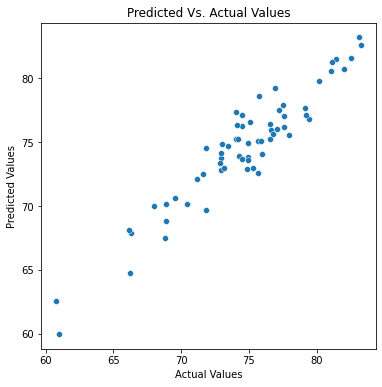

<Figure size 432x432 with 0 Axes>

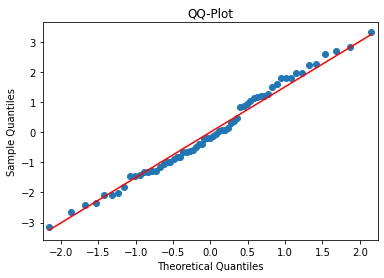

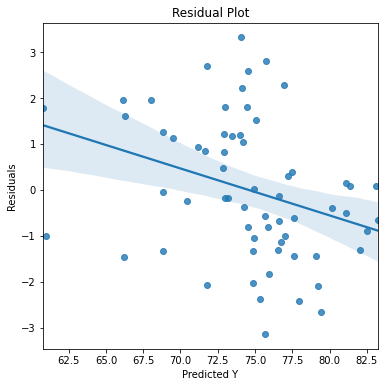

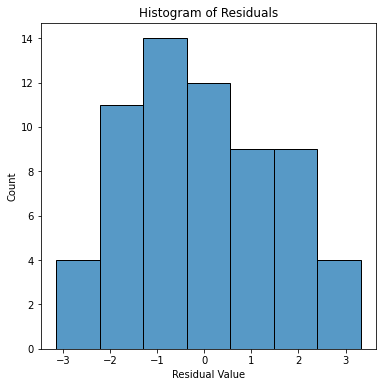

In [16]:
y_pred_1, lin_mod_1 = regression(LinearRegression,x_1,y_life_1,'Linear')

In [17]:
# Double Check Results using statsmodel

x_1_stats = sm.add_constant(x_1)
mod = sm.OLS(y_life_1,x_1_stats)
mod = mod.fit()
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lifeexp   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     27.51
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           3.08e-18
Time:                        14:45:36   Log-Likelihood:                -115.22
No. Observations:                  63   AIC:                             262.4
Df Residuals:                      47   BIC:                             296.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 74.5465      0.220    339.165      0.000      74.104      74.989
literacyrate           0.3903      0.374      1.044      0.302      -0.362       1.143
homicidiesper100k     -0.0761      0.274     -0.277      0.783      -0.628       0.476
electricity            0.0033      0.514      0.006      0.995      -1.032       1.038
Schooling              0.6336      0.431      1.469      0.148      -0.234       1.501
HIV.AIDS              -0.9876      0.351     -2.815      0.007      -1.693      -0.282
wateraccess            0.0214      0.366      0.058      0.954      -0.715       0.758
tuberculosis          -1.7937      0.373     -4.811      0.000      -2.544      -1.044
inflation             -0.5875      0.295     -1.989      0.053      -1.182       0.007
healthexppercapita     1.8557      0.602      3.080      0.003       0.644       3.068
internet              -0.2852      0.541     -0.528      0.600      -1.373       0.802
gdppercapita           0.4483      0.554      0.809      0.423      -0.667       1.564
CO2                   -1.1069      0.426     -2.596      0.013      -1.965      -0.249
forest                -0.1863      0.262     -0.710      0.481      -0.714       0.341
urbanpop               0.1906      0.375      0.508      0.614      -0.564       0.946
urbanpopgrowth         0.5374      0.337      1.596      0.117      -0.140       1.215
==============================================================================
Omnibus:                        2.757   Durbin-Watson:                   2.384
Prob(Omnibus):                  0.252   Jarque-Bera (JB):                1.752
Skew:                          -0.165   Prob(JB):                        0.416
Kurtosis:                       2.253   Cond. No.                         9.26
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

EVALUATION METRICS
R2:   0.76547
MAE:  0.27123
MSE:  0.12303
RMSE: 0.35076
COEFFICIENTS
Intercept: 2.0937
literacyrate: -0.127825
P-Value: 0.148671
homicidiesper100k: -0.032638
P-Value: 0.611722
electricity: -0.030114
P-Value: 0.802528
Schooling: -0.084928
P-Value: 0.401814
HIV.AIDS: 0.209029
P-Value: 0.013758
wateraccess: -0.22653
P-Value: 0.010726
tuberculosis: -0.027541
P-Value: 0.752385
inflation: 0.010093
P-Value: 0.883905
healthexppercapita: -0.083376
P-Value: 0.555027
internet: -0.010693
P-Value: 0.932653
gdppercapita: -0.113715
P-Value: 0.382688
CO2: 0.03944
P-Value: 0.692945
forest: 0.037749
P-Value: 0.539371
urbanpop: 0.125086
P-Value: 0.158754
urbanpopgrowth: 0.15642
P-Value: 0.051746


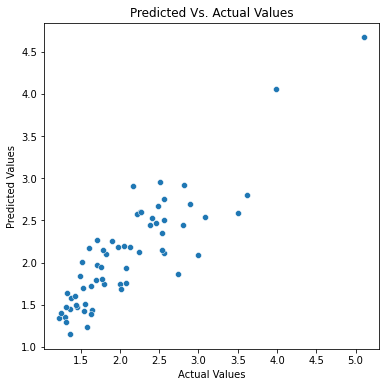

<Figure size 432x432 with 0 Axes>

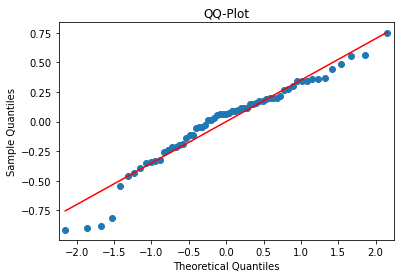

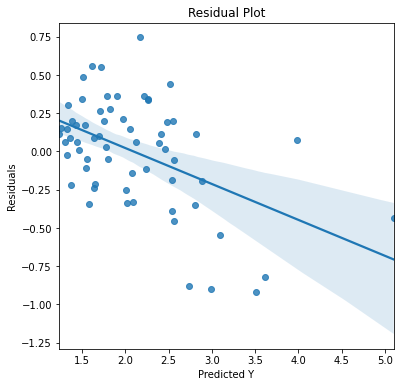

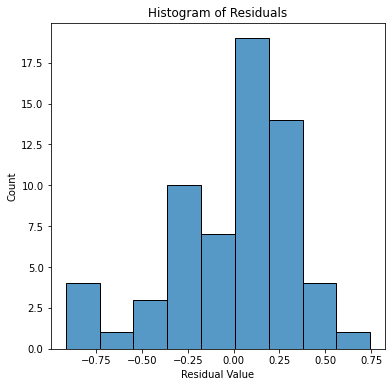

In [18]:
# DS 1 fertility model

y_pred_1, lin_mod_1 = regression(LinearRegression,x_1,y_fert_1,'Linear')

In [19]:
# Stats Model for Fertility

x_1_stats = sm.add_constant(x_1)
mod = sm.OLS(y_fert_1,x_1_stats)
mod = mod.fit()
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          fertilityrate   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.691
Method:                 Least Squares   F-statistic:                     10.23
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           3.41e-10
Time:                        14:45:37   Log-Likelihood:                -23.391
No. Observations:                  63   AIC:                             78.78
Df Residuals:                      47   BIC:                             113.1
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  2.0937      0.051     40.921      0.000       1.991       2.197
literacyrate          -0.1278      0.087     -1.468      0.149      -0.303       0.047
homicidiesper100k     -0.0326      0.064     -0.511      0.612      -0.161       0.096
electricity           -0.0301      0.120     -0.251      0.803      -0.271       0.211
Schooling             -0.0849      0.100     -0.846      0.402      -0.287       0.117
HIV.AIDS               0.2090      0.082      2.560      0.014       0.045       0.373
wateraccess           -0.2265      0.085     -2.657      0.011      -0.398      -0.055
tuberculosis          -0.0275      0.087     -0.317      0.752      -0.202       0.147
inflation              0.0101      0.069      0.147      0.884      -0.128       0.148
healthexppercapita    -0.0834      0.140     -0.595      0.555      -0.366       0.199
internet              -0.0107      0.126     -0.085      0.933      -0.264       0.242
gdppercapita          -0.1137      0.129     -0.881      0.383      -0.373       0.146
CO2                    0.0394      0.099      0.397      0.693      -0.160       0.239
forest                 0.0377      0.061      0.618      0.539      -0.085       0.161
urbanpop               0.1251      0.087      1.432      0.159      -0.051       0.301
urbanpopgrowth         0.1564      0.078      1.996      0.052      -0.001       0.314
==============================================================================
Omnibus:                        7.196   Durbin-Watson:                   1.652
Prob(Omnibus):                  0.027   Jarque-Bera (JB):                6.403
Skew:                           0.731   Prob(JB):                       0.0407
Kurtosis:                       3.548   Cond. No.                         9.26
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

EVALUATION METRICS
R2:   0.86568
MAE:  2.32598
MSE:  8.97154
RMSE: 2.99525
COEFFICIENTS
Intercept: 71.6157
Schooling: 2.766109
P-Value: 0.0
HIV.AIDS: -2.545157
P-Value: 0.0
wateraccess: 2.001995
P-Value: 2e-06
tuberculosis: -0.600216
P-Value: 0.113224
inflation: -0.069707
P-Value: 0.809295
healthexppercapita: 1.904883
P-Value: 1.1e-05
CO2: -0.148027
P-Value: 0.680974
urbanpopgrowth: 0.052441
P-Value: 0.883773


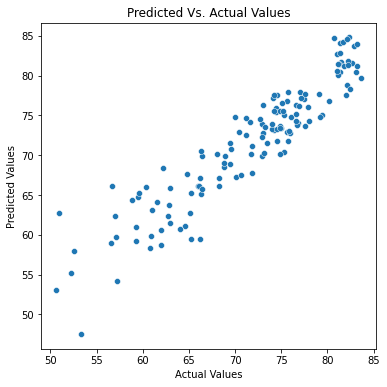

<Figure size 432x432 with 0 Axes>

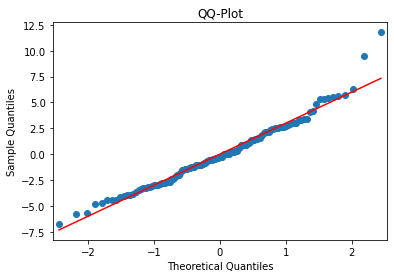

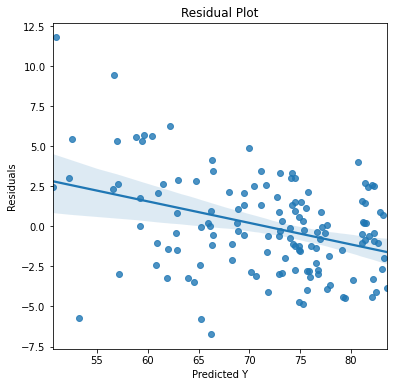

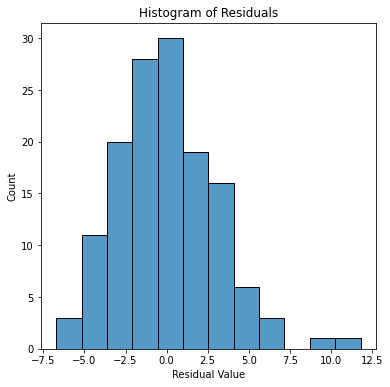

In [20]:
y_pred_2, lin_mod_2 = regression(LinearRegression,x_2,y_life_2,'Linear')

In [21]:
# Double Check Results using statsmodel

x_2_stats = sm.add_constant(x_2)
mod = sm.OLS(y_life_2,x_2_stats)
mod = mod.fit()
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                lifeexp   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.857
Method:                 Least Squares   F-statistic:                     103.9
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           1.86e-52
Time:                        14:45:37   Log-Likelihood:                -347.20
No. Observations:                 138   AIC:                             712.4
Df Residuals:                     129   BIC:                             738.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 71.6157      0.264    271.563      0.000      71.094      72.137
Schooling              2.7661      0.483      5.724      0.000       1.810       3.722
HIV.AIDS              -2.5452      0.354     -7.180      0.000      -3.247      -1.844
wateraccess            2.0020      0.399      5.019      0.000       1.213       2.791
tuberculosis          -0.6002      0.376     -1.595      0.113      -1.345       0.144
inflation             -0.0697      0.288     -0.242      0.809      -0.640       0.501
healthexppercapita     1.9049      0.416      4.576      0.000       1.081       2.729
CO2                   -0.1480      0.359     -0.412      0.681      -0.859       0.563
urbanpopgrowth         0.0524      0.358      0.146      0.884      -0.656       0.761
==============================================================================
Omnibus:                       14.543   Durbin-Watson:                   1.893
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               17.807
Skew:                          -0.648   Prob(JB):                     0.000136
Kurtosis:                       4.190   Cond. No.                         4.30
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

EVALUATION METRICS
R2:   0.75144
MAE:  0.52361
MSE:  0.48087
RMSE: 0.69345
COEFFICIENTS
Intercept: 2.8329
Schooling: -0.377129
P-Value: 0.000989
HIV.AIDS: 0.267239
P-Value: 0.001442
wateraccess: -0.562004
P-Value: 0.0
tuberculosis: -0.185099
P-Value: 0.035561
inflation: -0.050007
P-Value: 0.455015
healthexppercapita: 0.00375
P-Value: 0.969021
CO2: -0.256977
P-Value: 0.002453
urbanpopgrowth: 0.336543
P-Value: 8.4e-05


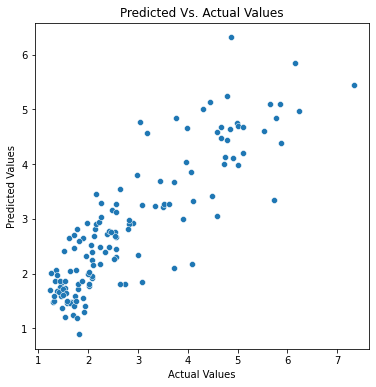

<Figure size 432x432 with 0 Axes>

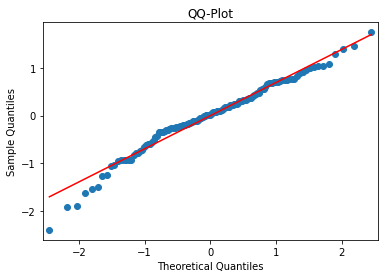

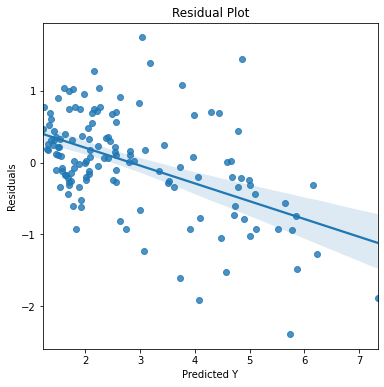

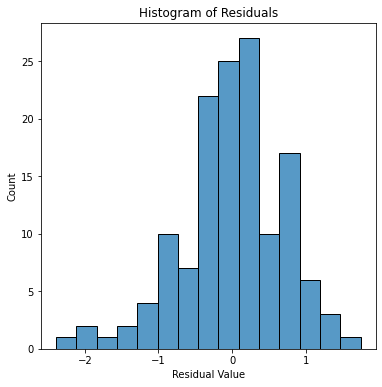

In [22]:
# DS 2 fertility model

y_pred_2, lin_mod_2 = regression(LinearRegression,x_2,y_fert_2,'Linear')

In [23]:
x_2_stats = sm.add_constant(x_2)
mod = sm.OLS(y_fert_2,x_2_stats)
mod = mod.fit()
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          fertilityrate   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     48.75
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           2.14e-35
Time:                        14:45:38   Log-Likelihood:                -145.29
No. Observations:                 138   AIC:                             308.6
Df Residuals:                     129   BIC:                             334.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  2.8329      0.061     46.399      0.000       2.712       2.954
Schooling             -0.3771      0.112     -3.371      0.001      -0.598      -0.156
HIV.AIDS               0.2672      0.082      3.256      0.001       0.105       0.430
wateraccess           -0.5620      0.092     -6.085      0.000      -0.745      -0.379
tuberculosis          -0.1851      0.087     -2.124      0.036      -0.358      -0.013
inflation             -0.0500      0.067     -0.749      0.455      -0.182       0.082
healthexppercapita     0.0038      0.096      0.039      0.969      -0.187       0.194
CO2                   -0.2570      0.083     -3.090      0.002      -0.422      -0.092
urbanpopgrowth         0.3365      0.083      4.060      0.000       0.173       0.501
==============================================================================
Omnibus:                       10.277   Durbin-Watson:                   1.852
Prob(Omnibus):                  0.006   Jarque-Bera (JB):               11.065
Skew:                           0.541   Prob(JB):                      0.00396
Kurtosis:                       3.869   Cond. No.                         4.30
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [24]:
y_life_2 = life_df_2['lifeexp']
y_fert_2 = life_df_2['fertilityrate']
x_2 = data=life_df_2.drop(['Country','lifeexp',
                    'fertilityrate','leastdeveloped','Status'],axis = 1)

x_2 = pd.DataFrame(data=StandardScaler().fit_transform(x_2),
                  columns = x_2.columns)

In [25]:
x_train, x_test, y_train_life, y_test_life = train_test_split(x_2,y_life_2,
                                                test_size=0.2, random_state=420)

print(x_train.shape)
print(x_test.shape)
print(y_train_life.shape)
print(y_test_life.shape)

(110, 8)
(28, 8)
(110,)
(28,)


In [26]:
x_train, x_test, y_train_fert, y_test_fert = train_test_split(x_2,y_fert_2,
                                                test_size=0.2, random_state=420)

print(x_train.shape)
print(x_test.shape)
print(y_train_fert.shape)
print(y_test_fert.shape)

(110, 8)
(28, 8)
(110,)
(28,)


EVALUATION METRICS
R2:   0.8576
MAE:  2.31475
MSE:  9.27141
RMSE: 3.0449
COEFFICIENTS
Intercept: 71.8796
Schooling: 2.913397
P-Value: 1e-06
HIV.AIDS: -2.373193
P-Value: 0.0
wateraccess: 1.975633
P-Value: 1.8e-05
tuberculosis: -0.635789
P-Value: 0.118787
inflation: 0.127762
P-Value: 0.71353
healthexppercapita: 1.843809
P-Value: 0.000216
CO2: -0.035437
P-Value: 0.929219
urbanpopgrowth: -0.055885
P-Value: 0.89184


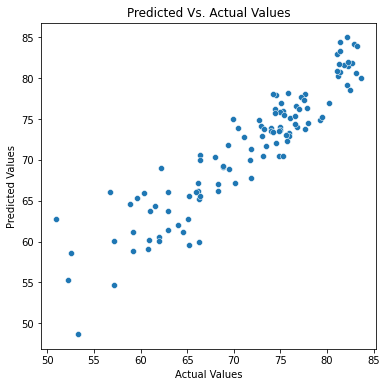

<Figure size 432x432 with 0 Axes>

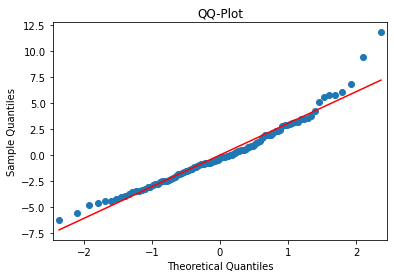

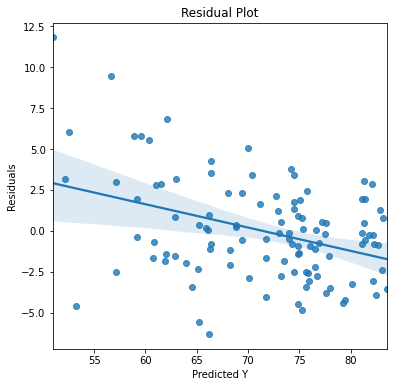

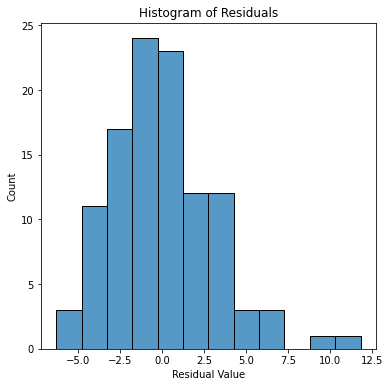

In [27]:
lin_mod = regression(LinearRegression,x_train,
            y_train_life,'Linear',return_y_pred = False)

In [28]:
y_pred_lin = lin_mod.predict(x_test)

regression_results(y_test_life, y_pred_lin)

EVALUATION METRICS
R2:   0.8829
MAE:  2.54404
MSE:  8.51701
RMSE: 2.91839


EVALUATION METRICS
R2:   0.85542
MAE:  2.3054
MSE:  9.41347
RMSE: 3.06814
COEFFICIENTS
Intercept: 71.8709
Schooling: 2.560114
HIV.AIDS: -2.12642
wateraccess: 1.871438
tuberculosis: -0.798766
inflation: 0.004874
healthexppercapita: 1.735432
CO2: 0.183609
urbanpopgrowth: -0.311684


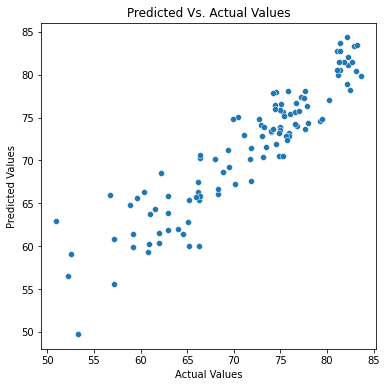

<Figure size 432x432 with 0 Axes>

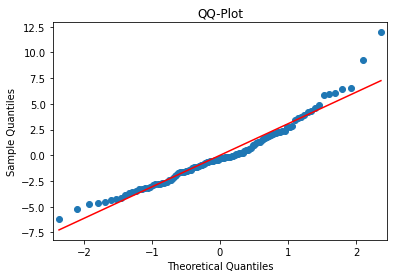

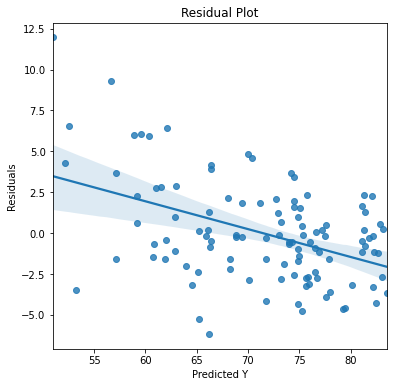

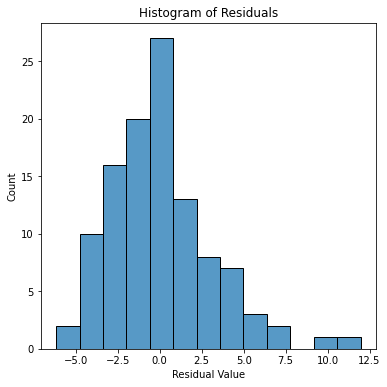

In [29]:
ridge_mod = regression(RidgeCV,x_train,y_train_life,'Linear',
                                 return_y_pred = False, alphas=(0.01,0.1,1,10))

In [30]:
y_pred_ridge = ridge_mod.predict(x_test)

regression_results(y_test_life, y_pred_ridge)

EVALUATION METRICS
R2:   0.88108
MAE:  2.51043
MSE:  8.64922
RMSE: 2.94096


EVALUATION METRICS
R2:   0.85709
MAE:  2.30184
MSE:  9.30427
RMSE: 3.05029
COEFFICIENTS
Intercept: 71.8638
Schooling: 2.877137
HIV.AIDS: -2.315212
wateraccess: 1.942777
tuberculosis: -0.609776
inflation: 0.0
healthexppercapita: 1.761551
CO2: 0.0
urbanpopgrowth: -0.01436


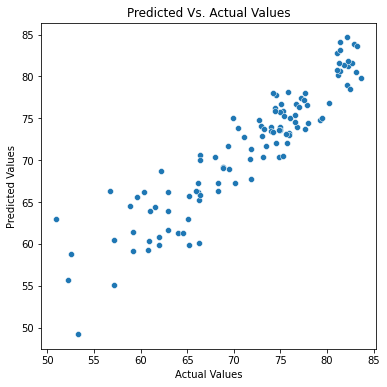

<Figure size 432x432 with 0 Axes>

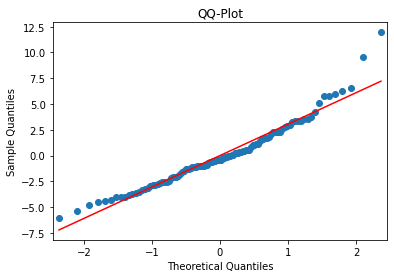

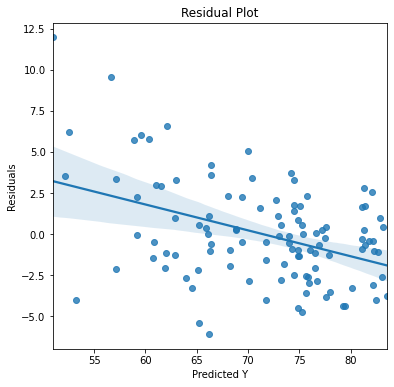

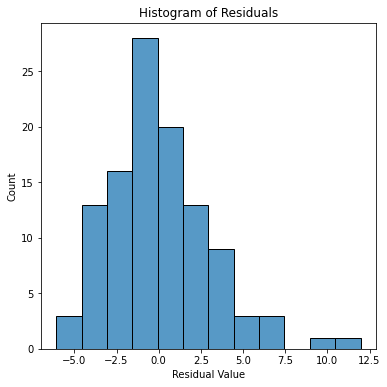

In [31]:
lasso_mod = regression(Lasso,x_train,y_train_life,'Linear',
                                 return_y_pred = False, alpha=0.1)

In [32]:
y_pred_lasso = lasso_mod.predict(x_test)

regression_results(y_test_life, y_pred_lasso)

EVALUATION METRICS
R2:   0.88582
MAE:  2.49208
MSE:  8.30416
RMSE: 2.88169


EVALUATION METRICS
R2:   0.9765
MAE:  0.8907
MSE:  1.52981
RMSE: 1.23685
Feature Importance Plot


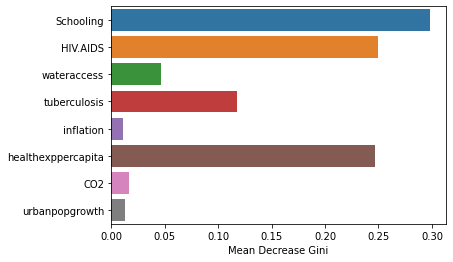

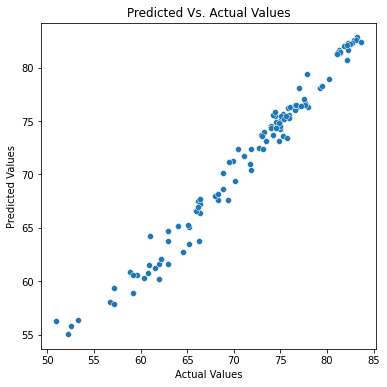

<Figure size 432x432 with 0 Axes>

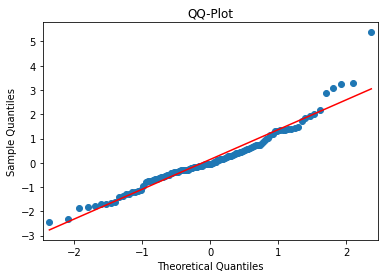

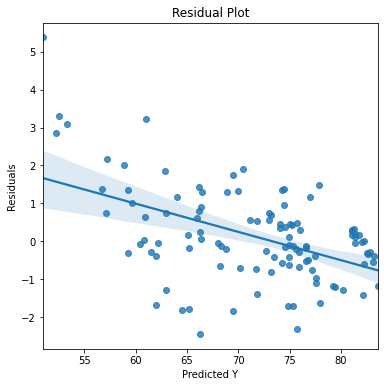

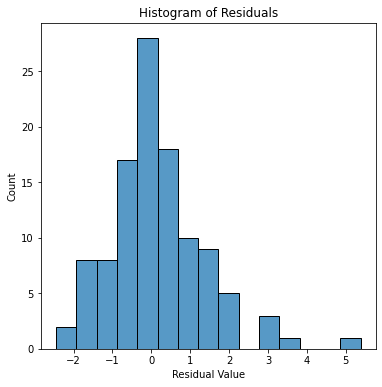

In [33]:
RF_mod = regression(RandomForestRegressor,x_train,y_train_life,'Tree',
                                 return_y_pred = False)

In [34]:
y_pred_RF = RF_mod.predict(x_test)

regression_results(y_test_life, y_pred_RF)

EVALUATION METRICS
R2:   0.93271
MAE:  1.60593
MSE:  4.8943
RMSE: 2.21231


EVALUATION METRICS
R2:   1.0
MAE:  0.00067
MSE:  0.0
RMSE: 0.00095
Feature Importance Plot


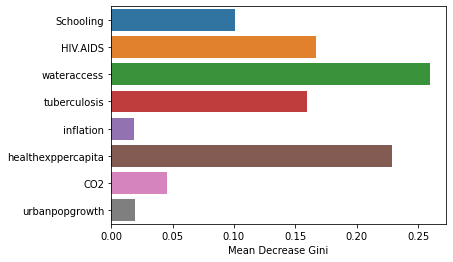

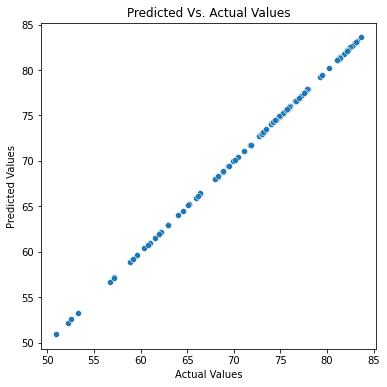

<Figure size 432x432 with 0 Axes>

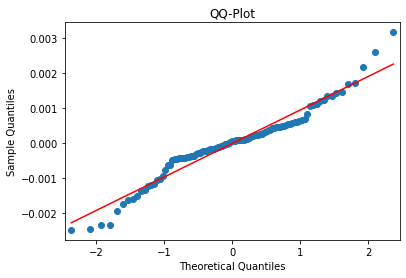

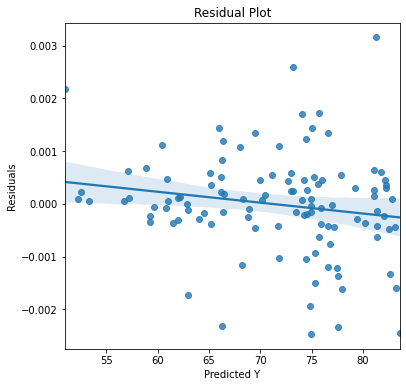

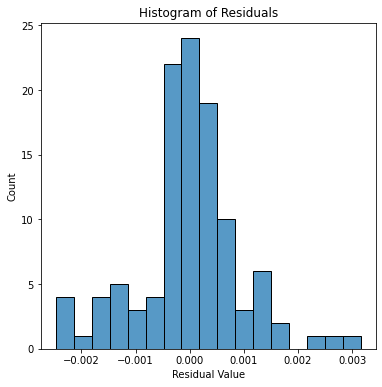

In [35]:
XGB_mod = regression(XGBRegressor,x_train,y_train_life,'Tree',
                                 return_y_pred = False)

In [36]:
y_pred_XGB = XGB_mod.predict(x_test)

regression_results(y_test_life, y_pred_XGB)

EVALUATION METRICS
R2:   0.92995
MAE:  1.76755
MSE:  5.09462
RMSE: 2.25713


EVALUATION METRICS
R2:   0.75749
MAE:  0.52681
MSE:  0.47341
RMSE: 0.68804
COEFFICIENTS
Intercept: 2.8045
Schooling: -0.378832
P-Value: 0.003241
HIV.AIDS: 0.202041
P-Value: 0.021122
wateraccess: -0.565672
P-Value: 0.0
tuberculosis: -0.134201
P-Value: 0.14478
inflation: -0.030708
P-Value: 0.696181
healthexppercapita: 0.039108
P-Value: 0.719395
CO2: -0.302155
P-Value: 0.001101
urbanpopgrowth: 0.382422
P-Value: 7.5e-05


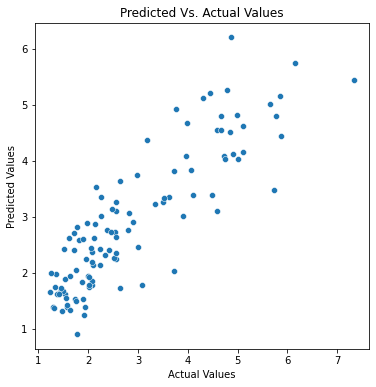

<Figure size 432x432 with 0 Axes>

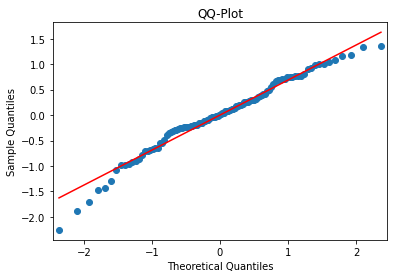

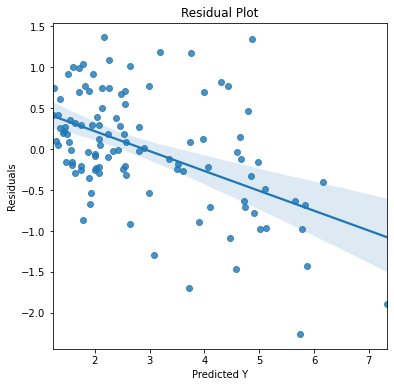

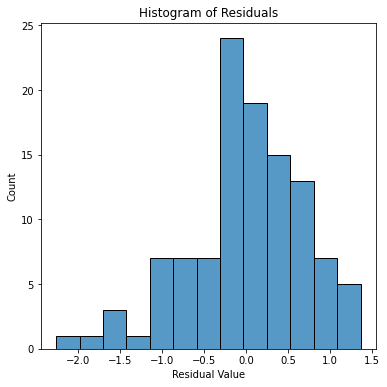

In [37]:
lin_mod_fert = regression(LinearRegression,x_train,
            y_train_fert,'Linear',return_y_pred = False)

In [38]:
y_pred_lin = lin_mod_fert.predict(x_test)

regression_results(y_test_fert, y_pred_lin)

EVALUATION METRICS
R2:   0.69996
MAE:  0.5383
MSE:  0.53805
RMSE: 0.73352


EVALUATION METRICS
R2:   0.75466
MAE:  0.53122
MSE:  0.47893
RMSE: 0.69205
COEFFICIENTS
Intercept: 2.8085
Schooling: -0.346136
HIV.AIDS: 0.182732
wateraccess: -0.524717
tuberculosis: -0.089533
inflation: -0.01353
healthexppercapita: -0.01301
CO2: -0.263543
urbanpopgrowth: 0.351909


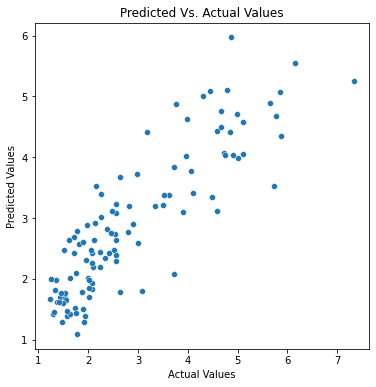

<Figure size 432x432 with 0 Axes>

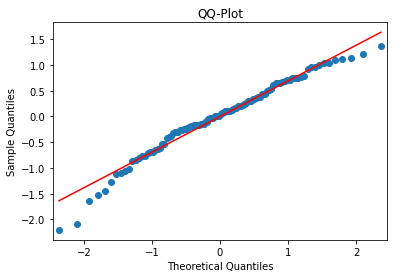

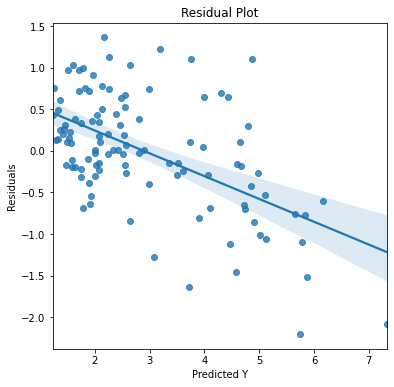

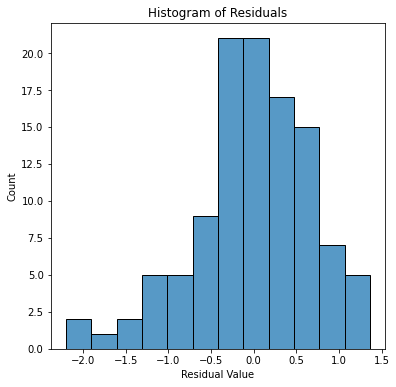

In [39]:
ridge_mod_fert = regression(RidgeCV,x_train,
            y_train_fert,'Linear',return_y_pred = False,alphas=(0.01,0.1,1,10))

In [40]:
y_pred_ridge = ridge_mod_fert.predict(x_test)

regression_results(y_test_fert, y_pred_ridge)

EVALUATION METRICS
R2:   0.70485
MAE:  0.53273
MSE:  0.52928
RMSE: 0.72752


EVALUATION METRICS
R2:   0.73763
MAE:  0.54844
MSE:  0.51218
RMSE: 0.71567
COEFFICIENTS
Intercept: 2.8132
Schooling: -0.322504
HIV.AIDS: 0.086541
wateraccess: -0.555771
tuberculosis: 0.0
inflation: 0.0
healthexppercapita: -0.0
CO2: -0.170367
urbanpopgrowth: 0.267632


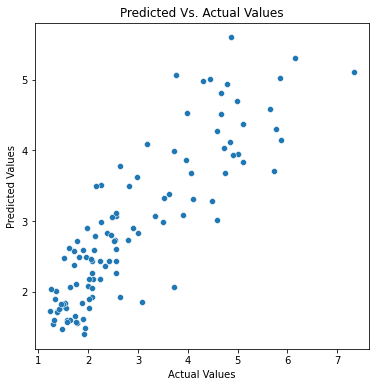

<Figure size 432x432 with 0 Axes>

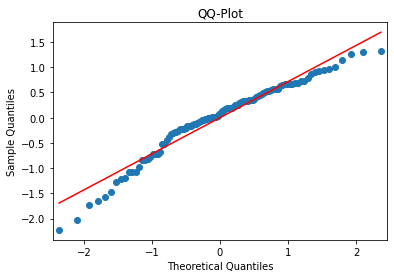

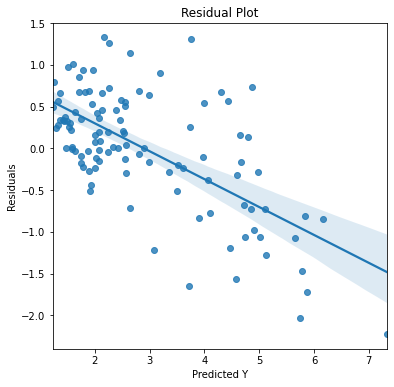

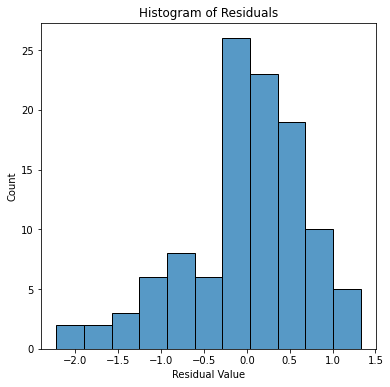

In [41]:
lasso_mod_fert = regression(Lasso,x_train,y_train_fert,'Linear',
                                 return_y_pred = False, alpha=0.1)

In [42]:
y_pred_lasso = lasso_mod_fert.predict(x_test)

regression_results(y_test_fert, y_pred_lasso)

EVALUATION METRICS
R2:   0.6883
MAE:  0.52338
MSE:  0.55897
RMSE: 0.74764


EVALUATION METRICS
R2:   0.95937
MAE:  0.2002
MSE:  0.07932
RMSE: 0.28163
Feature Importance Plot


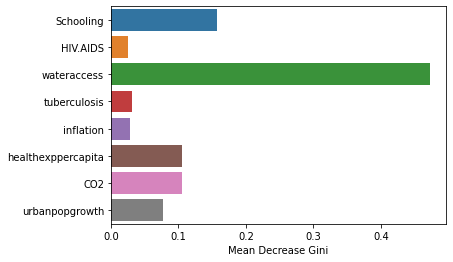

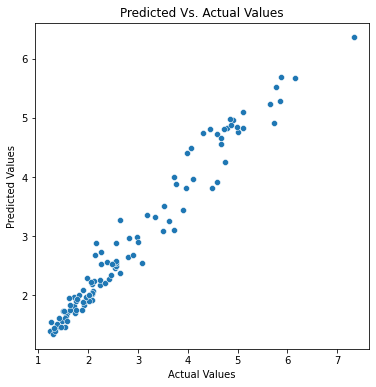

<Figure size 432x432 with 0 Axes>

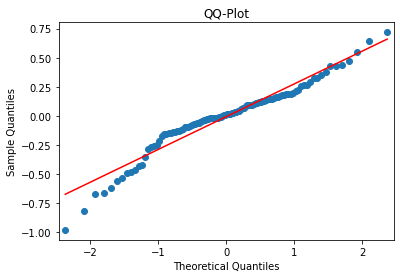

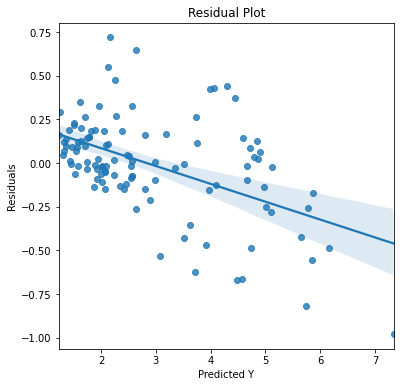

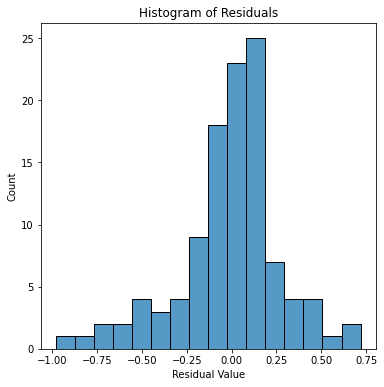

In [43]:
RF_mod_fert = regression(RandomForestRegressor,x_train,y_train_fert,'Tree',
                                 return_y_pred = False)

In [44]:
y_pred_RF = RF_mod_fert.predict(x_test)

regression_results(y_test_fert, y_pred_RF)

EVALUATION METRICS
R2:   0.76338
MAE:  0.41071
MSE:  0.42433
RMSE: 0.65141


EVALUATION METRICS
R2:   1.0
MAE:  0.00064
MSE:  0.0
RMSE: 0.00086
Feature Importance Plot


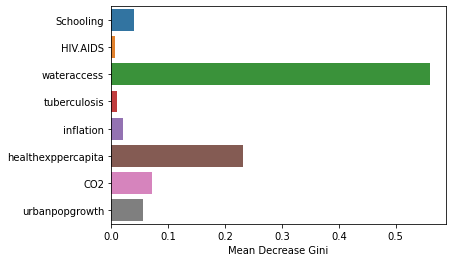

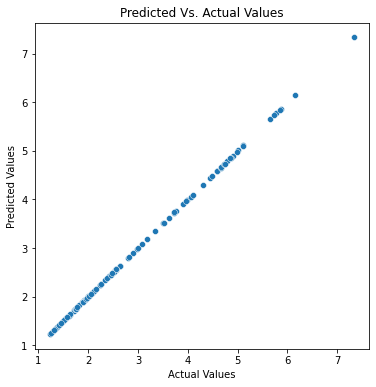

<Figure size 432x432 with 0 Axes>

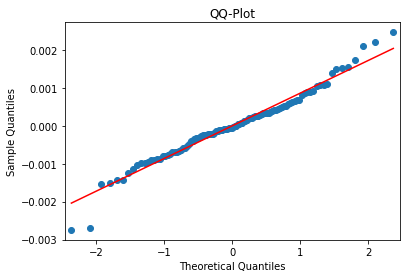

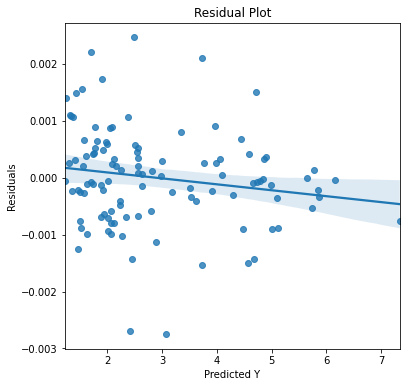

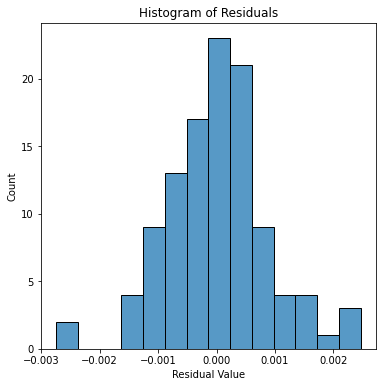

In [45]:
XGB_mod_fert = regression(XGBRegressor,x_train,y_train_fert,'Tree',
                                 return_y_pred = False)

In [46]:
y_pred_XGB = XGB_mod_fert.predict(x_test)

regression_results(y_test_fert, y_pred_XGB)

EVALUATION METRICS
R2:   0.64527
MAE:  0.55695
MSE:  0.63613
RMSE: 0.79758
